# Notebook demonstrating the use of Timeseriesai for generating predictions
https://github.com/timeseriesAI/timeseriesAI

## The below is done using the tutorial data set (one state, one season) and is a very small dataset so the results are only intended for use on how to use this, not necessarily what the ML capability is

### uses env timeseriesai

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from tsai.all import *
from joblib import Parallel, delayed
from openavalancheproject.tsai_utilities import *
import zarr
from fastai.callback.tracker import EarlyStoppingCallback


In [3]:
#chck if GPU is available
torch.cuda.device(0)
torch.cuda.is_available()

True

In [4]:
data_root = 'D:/OAPMLData/'

ml_path = data_root + '/4.MLData/'
interpolation = 1
label = 'Day1DangerAboveTreeline'
file_label = 'co_day1above_3h_tutorial'

In [5]:
#load the full X datafile which has both Train and Test concated
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(500, 981, 1441)

In [7]:
#initialize the utilities class
utils = TSAIUtilities(X, label)

In [8]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [9]:
#filter down the features to a smaller subset which are more relevant
filtered_feature_list = utils.filter_features(set(feature_names), only_var=False)
print(len(filtered_feature_list))

95


In [10]:
#get those features indexes
filtered_feature_indexes = [list(feature_names).index(x) for x in filtered_feature_list]

In [11]:
#filter down the X data to only those features
#also filter down to only the last 84 days of data
X_small_84 = X.get_orthogonal_selection((slice(None), filtered_feature_indexes, slice(1442-8*84, 1441)))

In [12]:
X_small_84.shape #(samples, features, timesteps)

(500, 95, 671)

In [13]:
#read in the corresponding label files and concat them
#can get the right values here based on the contents of the ml_path directory

num_train_files = 4
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 1
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [14]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Low             148
Moderate        143
Considerable    117
High             92
Name: count, dtype: int64

In [15]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [16]:
#last 100 days are test
splits = (L(range(0,400)).shuffle(), L(range(400,500)).shuffle())


In [17]:
#calculate the min and maxes so we can normalize the data
feature_mins, feature_maxs = utils.calc_min_max(X_small_84, 0, 400)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [18]:
feature_mins_test, feature_maxs_test = utils.calc_min_max(X_small_84, 400, X.shape[0])

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [19]:
X = X_small_84

In [20]:
splits, dls = utils.create_dls(X_small_84, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1, splits=splits)
splits

((#400) [358,349,63,227,375,75,133,370,300,383...],
 (#100) [495,449,431,403,464,446,437,468,435,421...])

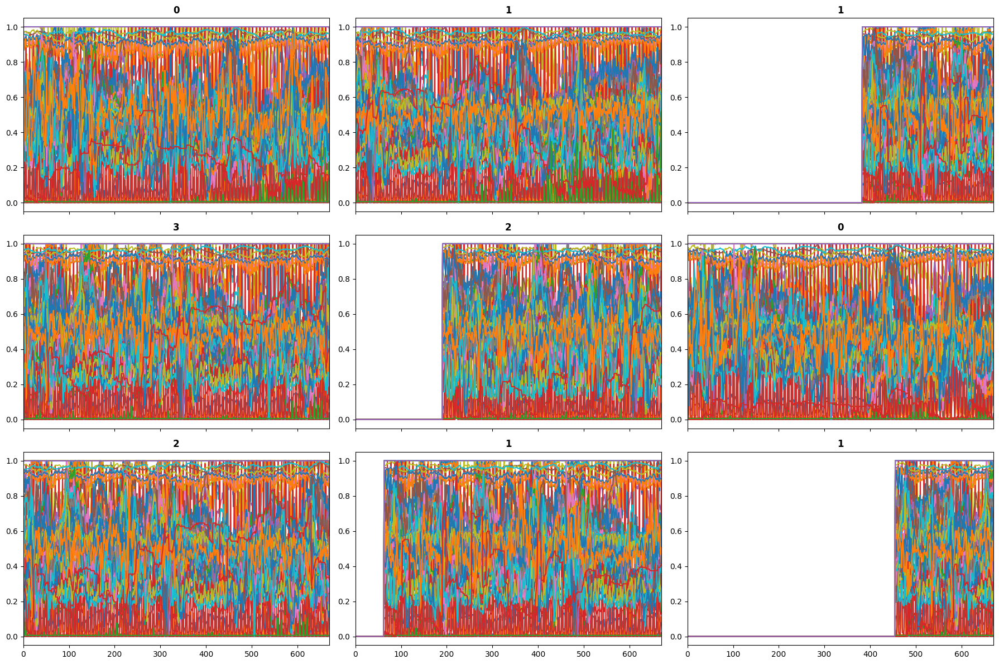

In [21]:
#check the data from the dataloader to ensure its normalized correctly
dls.show_batch()

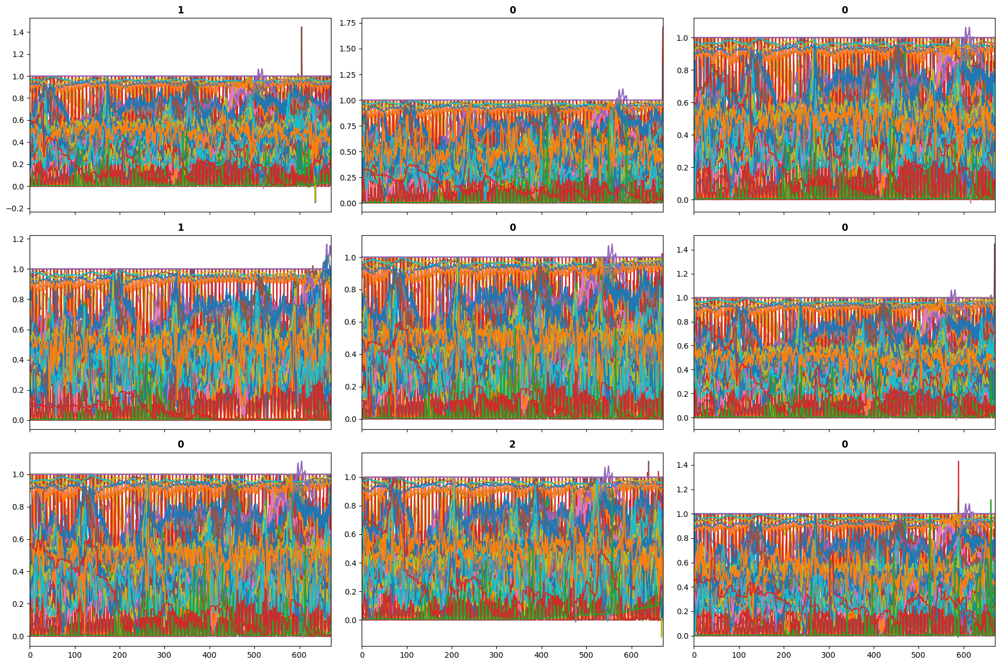

In [22]:
#since normalization values (min/max) are just set on our small training set some of these values might be outside the range
#a larger and more representative training set would improve this
dls.valid.show_batch()

# Lets try and train a model, in the tutorial case we are using an extremely small dataset so no conclusions should be drawn from these results they are for illustrative purposes only

In [29]:
model = TSTPlus(dls.vars, dls.c, dls.len, d_ff=256, d_k=32, d_model=128, d_v=32, dropout=.7, fc_dropout=.1, n_heads=16, n_layers=3)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[accuracy, BalancedAccuracy()],  cbs=[ShowGraphCallback2(), PredictionDynamics()])

SuggestedLRs(valley=5.248074739938602e-05)

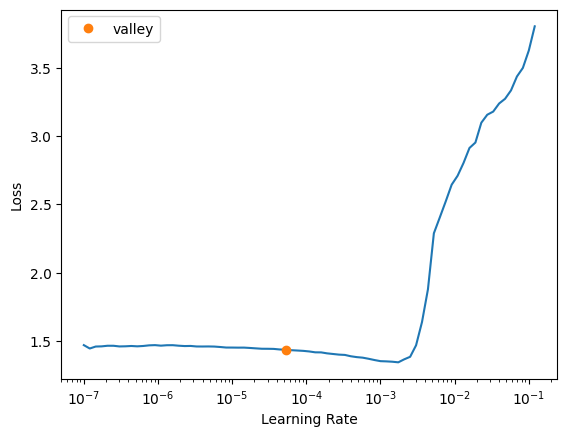

In [25]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.461693,1.344478,0.420000,0.325405,00:02
1,1.444226,1.341888,0.420000,0.318182,00:02
2,1.419731,1.338226,0.440000,0.333333,00:02
3,1.407508,1.326143,0.440000,0.333333,00:02
4,1.382182,1.313726,0.430000,0.326286,00:02
5,1.344388,1.288548,0.480000,0.365046,00:02
6,1.315316,1.299669,0.540000,0.414376,00:02
7,1.283139,1.260546,0.520000,0.397992,00:02
8,1.250509,1.238437,0.490000,0.374560,00:02
9,1.217575,1.235109,0.510000,0.391121,00:02


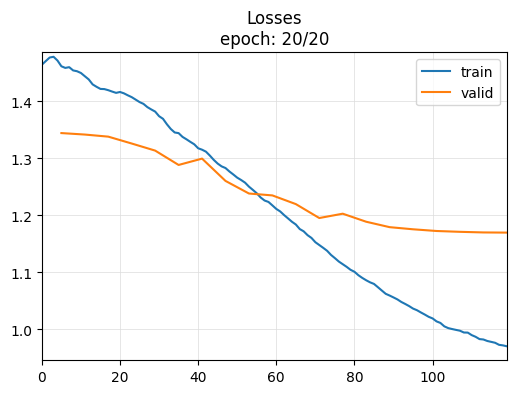

,train_loss,valid_loss,accuracy,balanced_accuracy_score
19,0.970384,1.169834,0.52,0.396054


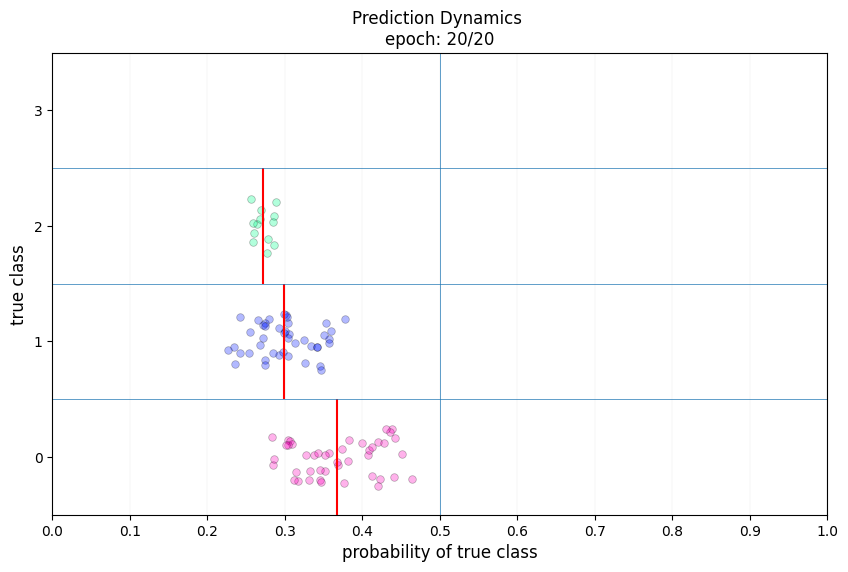

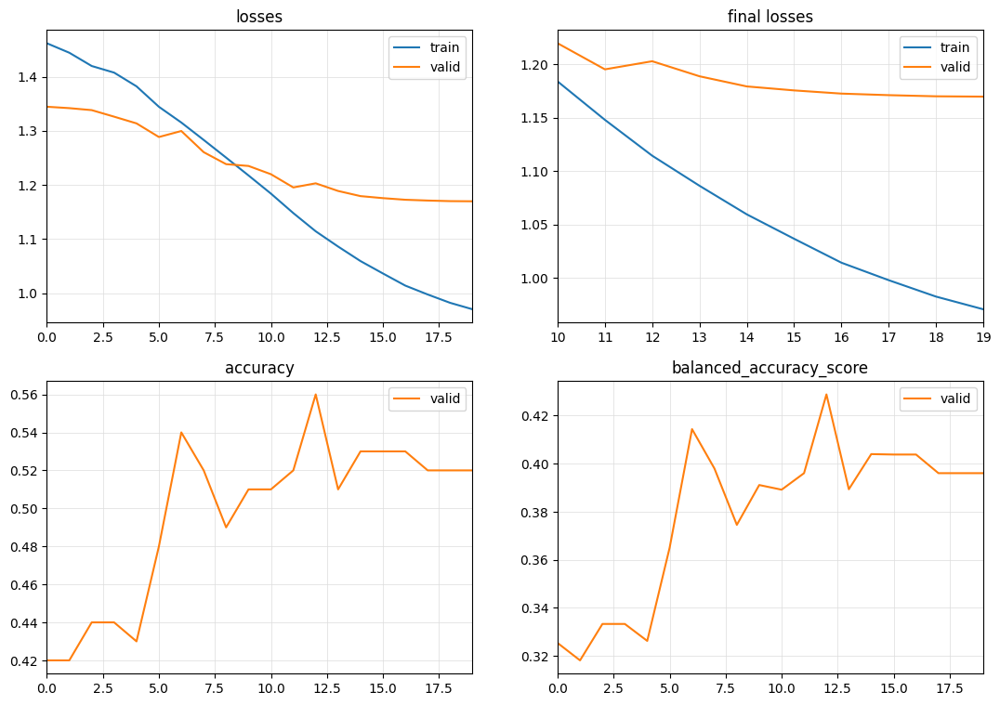

In [30]:
learn.fit_one_cycle(20, 1e-4)

## Below is with a much larger and more representative training set
### Current results represnt state of the art for this project at 51.3205% Balanced Accuracy

In [30]:
file_label = 'ca_co_day1above_3h_28d_small'
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [31]:
X.shape

(48000, 82, 225)

In [32]:

utils = TSAIUtilities(X, label)
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [33]:
feature_names

array(['ACPCP_surface_sum', 'APCP_surface_sum', 'APTMP_2maboveground_avg',
       'CAPE_180M0mbaboveground_avg', 'CAPE_255M0mbaboveground_avg',
       'CAPE_surface_avg', 'CIN_180M0mbaboveground_avg',
       'CIN_255M0mbaboveground_avg', 'CIN_surface_avg',
       'GUST_surface_avg', 'RH_0D72M0D94sigmalayer_avg',
       'RH_2maboveground_avg', 'RH_30M0mbaboveground_avg', 'RH_350mb_avg',
       'RH_500mb_avg', 'SNOD_surface_avg', 'TMP_100maboveground_avg',
       'TMP_200mb_avg', 'TMP_2maboveground_avg',
       'TMP_30M0mbaboveground_avg', 'TMP_500mb_avg',
       'TMP_80maboveground_avg', 'TMP_975mb_avg', 'TMP_surface_avg',
       'UGRD_0D995sigmalevel_avg', 'UGRD_1000mb_avg', 'UGRD_100mb_avg',
       'UGRD_10mb_avg', 'UGRD_150mb_avg', 'UGRD_200mb_avg',
       'UGRD_20mb_avg', 'UGRD_250mb_avg', 'UGRD_300mb_avg',
       'UGRD_30mb_avg', 'UGRD_350mb_avg', 'UGRD_400mb_avg',
       'UGRD_450mb_avg', 'UGRD_500mb_avg', 'UGRD_50mb_avg',
       'UGRD_550mb_avg', 'UGRD_600mb_avg', 'UGRD_650mb_avg

In [34]:
num_train_files = 20
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 4
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [35]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Considerable    12000
High            12000
Moderate        12000
Low             12000
Name: count, dtype: int64

In [36]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [37]:
train_test_seperator = len(y_df[y_df['season'] != '20-21'])

In [13]:
splits = (L(range(0,train_test_seperator)).shuffle(), L(range(train_test_seperator,len(y_df))).shuffle())

In [14]:
#this can take a long time with a large dataset.  If dataset is larger than 10k samples use the notebook in Scratch/Notebooks to rechunk for this calculation only.
feature_mins, feature_maxs = utils.calc_min_max(X, 0, train_test_seperator)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80


In [15]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_mins_' + file_label + '.npy', feature_mins)
np.save(ml_path + 'feature_maxs_' + file_label + '.npy', feature_maxs)

In [38]:
#read feature_mins and feature_maxes from disk
feature_mins = np.load(ml_path + 'feature_mins_' + file_label + '.npy')
feature_maxs = np.load(ml_path + 'feature_maxs_' + file_label + '.npy')


In [49]:
splits2, dls = utils.create_dls(X, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1.0, splits=splits, batch_size=96)
splits2

((#40000) [20526,20992,11618,4886,29305,31670,31861,12838,37215,8711...],
 (#8000) [40112,47262,44411,42539,46023,41516,43685,44057,47857,40429...])

In [41]:
_, dls_14 = utils.create_dls(X[:,:,-14*8:], y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1.0, splits=splits, batch_size=96)

In [16]:
#more heads and layers
model = TSTPlus(dls.vars, dls.c, seq_len=X.shape[2], d_model=35, n_heads=35, d_k=1, d_v=2, d_ff=128, dropout=.2, n_layers=20, fc_dropout=.8, attn_dropout=.4, store_attn=False)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[ShowGraphCallback2(), PredictionDynamics()])

In [17]:
model = TSTPlus(dls.vars, dls.c, seq_len=X.shape[2], d_model=27, n_heads=27, d_k=1, d_v=2, d_ff=128, dropout=.2, n_layers=16, fc_dropout=.8, attn_dropout=.4, store_attn=False)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[ShowGraphCallback2(), PredictionDynamics()])

In [42]:
model = TSTPlus(dls.vars, dls.c, seq_len=X.shape[2], d_model=15, n_heads=15, d_k=1, d_v=2, d_ff=128, dropout=.2, n_layers=8, fc_dropout=.8, attn_dropout=.4, store_attn=False)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[ShowGraphCallback2(), PredictionDynamics()])

In [43]:
model_14 = TSTPlus(dls_14.vars, dls_14.c, seq_len=14*8, d_model=15, n_heads=15, d_k=1, d_v=2, d_ff=128, dropout=.2, n_layers=8, fc_dropout=.8, attn_dropout=.4, store_attn=False)
learn_14 = Learner(dls_14, model_14, loss_func=LabelSmoothingCrossEntropy(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[ShowGraphCallback2(), PredictionDynamics()])

In [44]:
lr = 1e-5

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.606580,1.392339,0.231375,0.231375,00:44
1,1.599589,1.387738,0.240125,0.240125,00:45
2,1.594009,1.382589,0.249500,0.249500,00:45
3,1.589961,1.375178,0.280125,0.280125,00:45
4,1.569467,1.365958,0.317250,0.317250,00:46
5,1.559306,1.353588,0.364000,0.364000,00:45
6,1.532514,1.336657,0.392500,0.392500,00:45
7,1.518022,1.312550,0.409000,0.409000,00:45
8,1.488955,1.279074,0.416125,0.416125,00:45
9,1.446596,1.242320,0.430750,0.430750,00:46


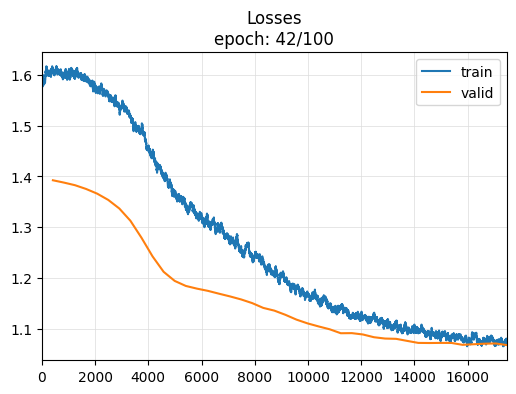

,train_loss,valid_loss,accuracy,balanced_accuracy_score
41,1.07204,1.067483,0.577125,0.577125


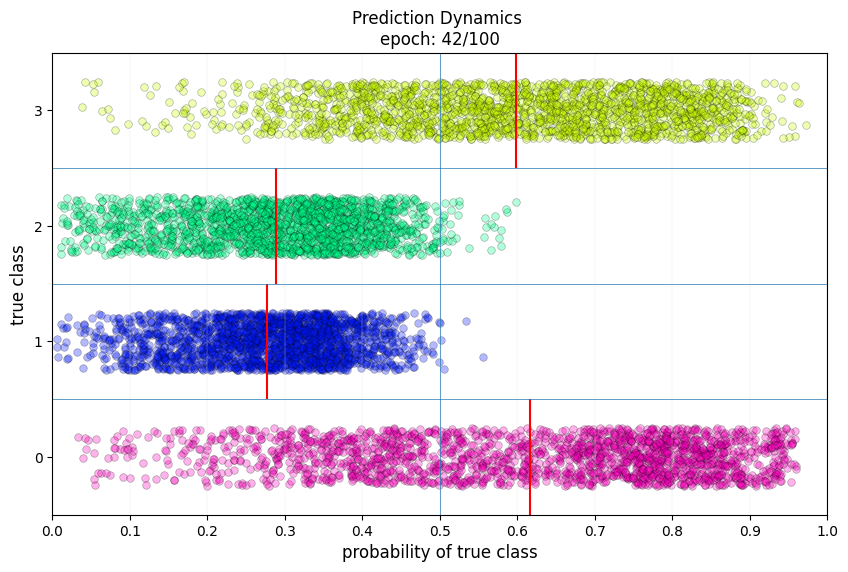

No improvement since epoch 32: early stopping


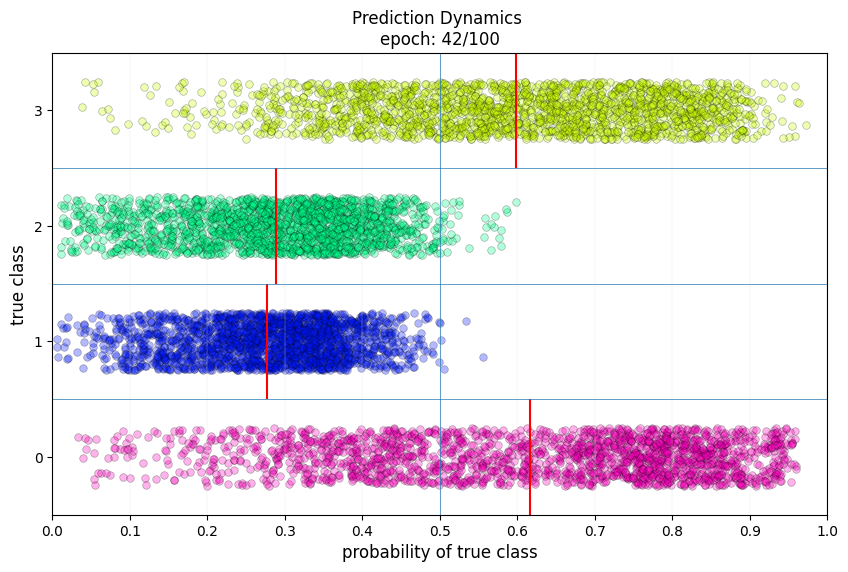

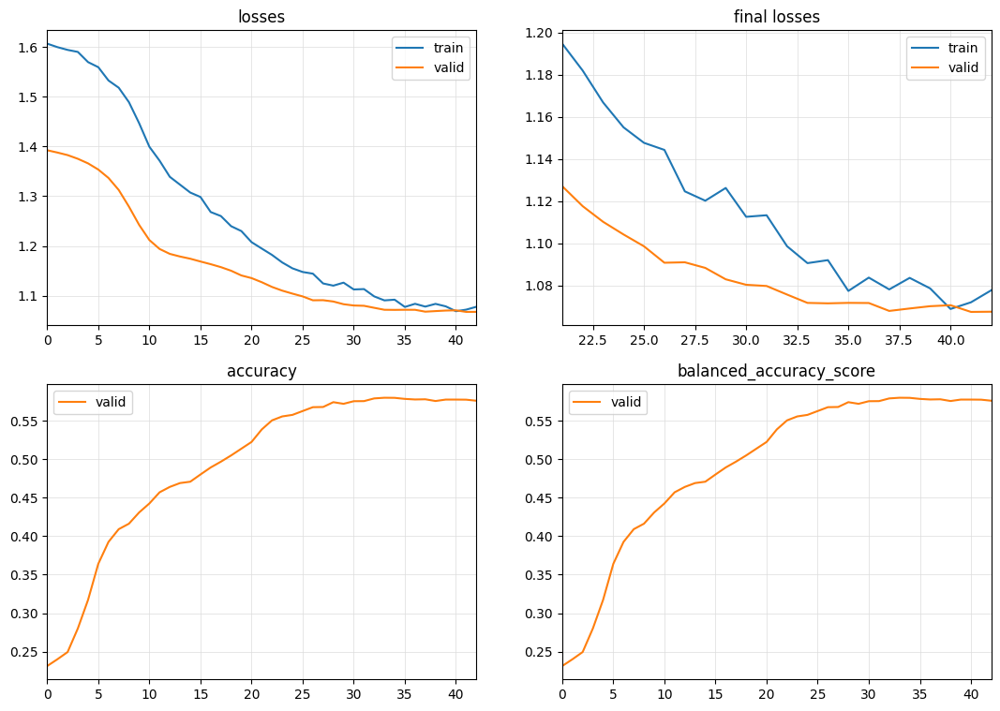

In [45]:
learn_14.fit_one_cycle(100, lr, cbs=[EarlyStoppingCallback(monitor='balanced_accuracy_score', min_delta=0.001, patience=10)])

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.596800,1.377553,0.273375,0.273375,02:50
1,1.607715,1.375679,0.276500,0.276500,02:16
2,1.592257,1.373185,0.286500,0.286500,02:15
3,1.588996,1.369780,0.293125,0.293125,02:15
4,1.582899,1.365165,0.301625,0.301625,02:15
5,1.565037,1.358432,0.301625,0.301625,02:15
6,1.560723,1.349054,0.306125,0.306125,02:15
7,1.539153,1.335922,0.313625,0.313625,02:15
8,1.517521,1.318666,0.330500,0.330500,02:15
9,1.489920,1.298712,0.353125,0.353125,02:16


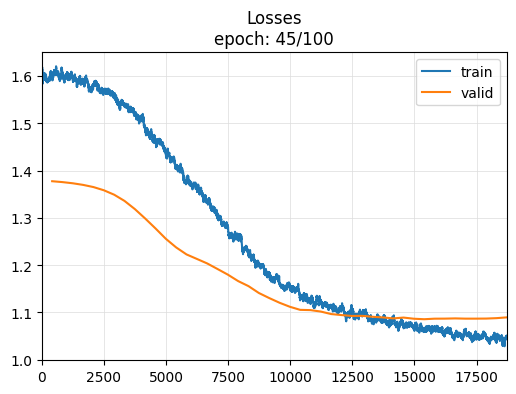

,train_loss,valid_loss,accuracy,balanced_accuracy_score
44,1.050757,1.089596,0.55125,0.55125


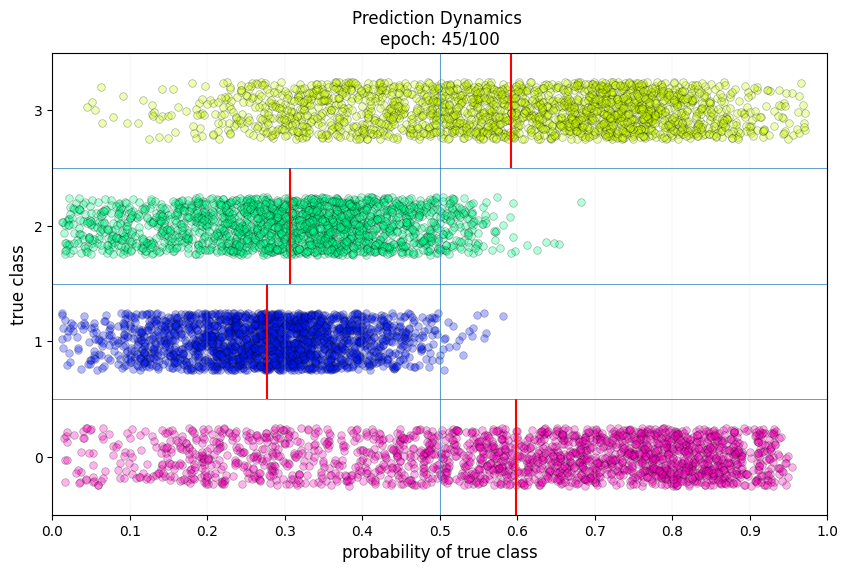

No improvement since epoch 35: early stopping


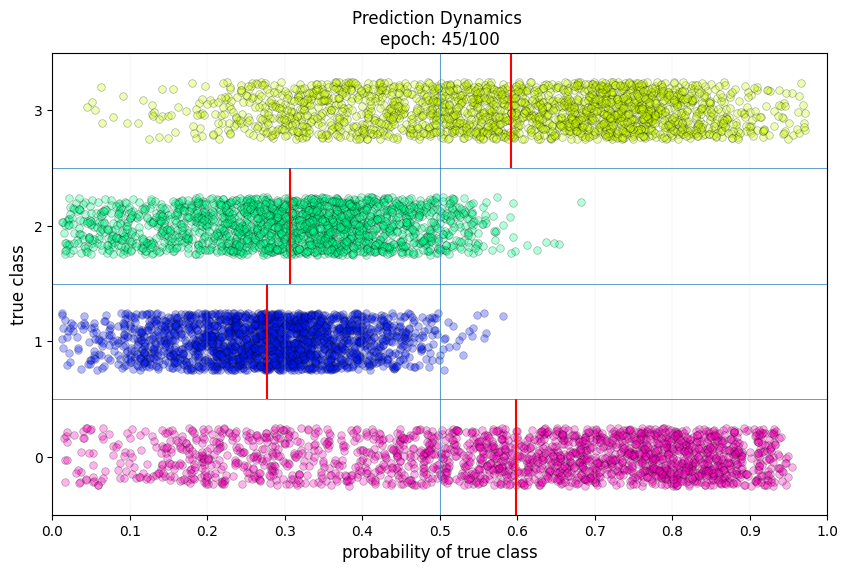

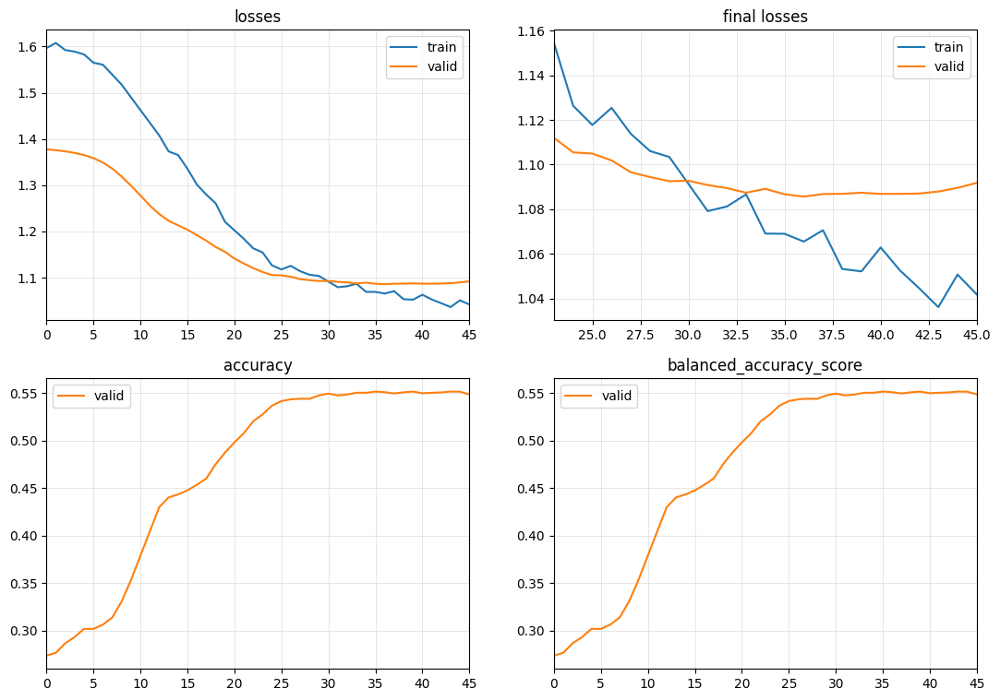

In [18]:
learn.fit_one_cycle(100, lr, cbs=[EarlyStoppingCallback(monitor='balanced_accuracy_score', min_delta=0.001, patience=10)])

### Results


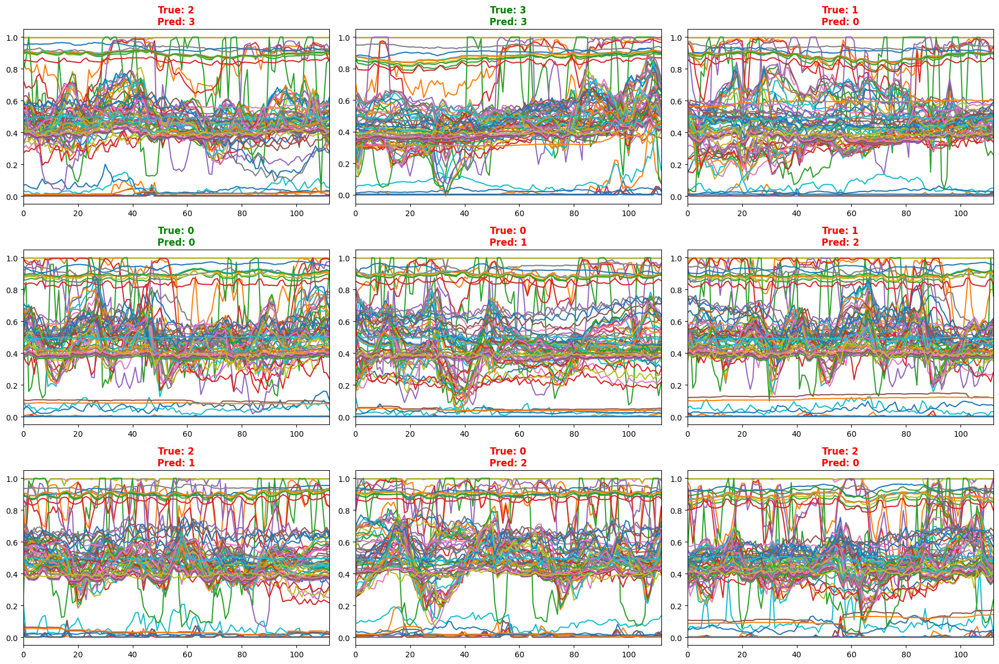

In [21]:
learn.show_results()

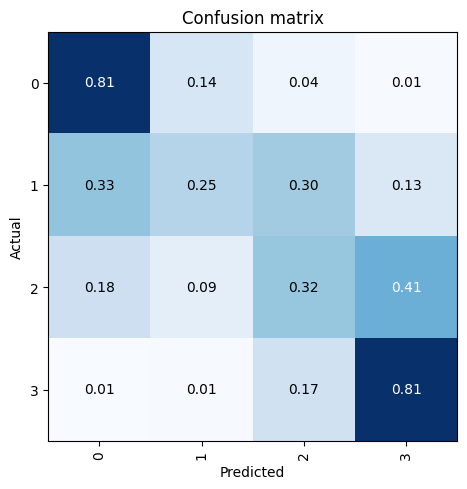

In [19]:
#28 days small
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

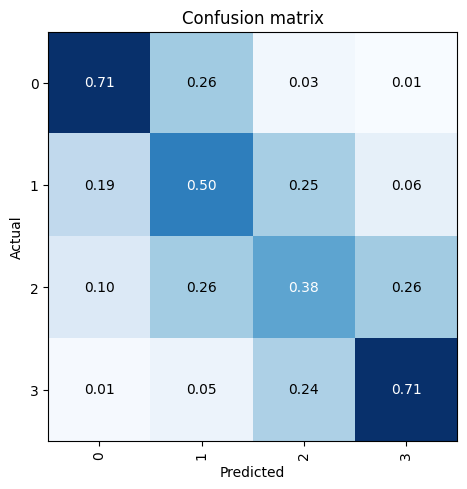

In [22]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [23]:
#print accuracy
interp.print_classification_report()

              precision    recall  f1-score   support

           0       0.64      0.71      0.67     16184
           1       0.50      0.50      0.50     21252
           2       0.43      0.38      0.41     21282
           3       0.68      0.71      0.69     21282

    accuracy                           0.57     80000
   macro avg       0.56      0.57      0.57     80000
weighted avg       0.56      0.57      0.56     80000



X.shape: (40000, 82, 225)
y.shape: (40000,)
Selected metric: accuracy
Computing feature importance (permutation method)...


  0 feature: BASELINE             accuracy: 0.622100


  0 feature: ACPCP_surface_sum    accuracy: 0.622075


  1 feature: APCP_surface_sum     accuracy: 0.620275


  2 feature: APTMP_2maboveground_avg accuracy: 0.622100


  3 feature: CAPE_180M0mbaboveground_avg accuracy: 0.622175


  4 feature: CAPE_255M0mbaboveground_avg accuracy: 0.622225


  5 feature: CAPE_surface_avg     accuracy: 0.622225


  6 feature: CIN_180M0mbaboveground_avg accuracy: 0.622700


  7 feature: CIN_255M0mbaboveground_avg accuracy: 0.621275


  8 feature: CIN_surface_avg      accuracy: 0.621800


  9 feature: GUST_surface_avg     accuracy: 0.618750


 10 feature: RH_0D72M0D94sigmalayer_avg accuracy: 0.621750


 11 feature: RH_2maboveground_avg accuracy: 0.620475


 12 feature: RH_30M0mbaboveground_avg accuracy: 0.621150


 13 feature: RH_350mb_avg         accuracy: 0.618250


 14 feature: RH_500mb_avg         accuracy: 0.617075


 15 feature: SNOD_surface_avg     accuracy: 0.622350


 16 feature: TMP_100maboveground_avg accuracy: 0.621300


 17 feature: TMP_200mb_avg        accuracy: 0.622075


 18 feature: TMP_2maboveground_avg accuracy: 0.622200


 19 feature: TMP_30M0mbaboveground_avg accuracy: 0.622775


 20 feature: TMP_500mb_avg        accuracy: 0.622425


 21 feature: TMP_80maboveground_avg accuracy: 0.622125


 22 feature: TMP_975mb_avg        accuracy: 0.622100


 23 feature: TMP_surface_avg      accuracy: 0.622275


 24 feature: UGRD_0D995sigmalevel_avg accuracy: 0.621200


 25 feature: UGRD_1000mb_avg      accuracy: 0.622500


 26 feature: UGRD_100mb_avg       accuracy: 0.618875


 27 feature: UGRD_10mb_avg        accuracy: 0.617450


 28 feature: UGRD_150mb_avg       accuracy: 0.623225


 29 feature: UGRD_200mb_avg       accuracy: 0.617225


 30 feature: UGRD_20mb_avg        accuracy: 0.618075


 31 feature: UGRD_250mb_avg       accuracy: 0.620825


 32 feature: UGRD_300mb_avg       accuracy: 0.617825


 33 feature: UGRD_30mb_avg        accuracy: 0.620325


 34 feature: UGRD_350mb_avg       accuracy: 0.620750


 35 feature: UGRD_400mb_avg       accuracy: 0.621650


 36 feature: UGRD_450mb_avg       accuracy: 0.618225


 37 feature: UGRD_500mb_avg       accuracy: 0.621400


 38 feature: UGRD_50mb_avg        accuracy: 0.621625


 39 feature: UGRD_550mb_avg       accuracy: 0.620600


 40 feature: UGRD_600mb_avg       accuracy: 0.618475


 41 feature: UGRD_650mb_avg       accuracy: 0.617350


 42 feature: UGRD_700mb_avg       accuracy: 0.623150


 43 feature: UGRD_70mb_avg        accuracy: 0.620975


 44 feature: UGRD_750mb_avg       accuracy: 0.622500


 45 feature: UGRD_800mb_avg       accuracy: 0.621925


 46 feature: UGRD_850mb_avg       accuracy: 0.621200


 47 feature: UGRD_900mb_avg       accuracy: 0.622500


 48 feature: UGRD_925mb_avg       accuracy: 0.621900


 49 feature: UGRD_950mb_avg       accuracy: 0.621625


 50 feature: UGRD_975mb_avg       accuracy: 0.622675


 51 feature: VGRD_0D995sigmalevel_avg accuracy: 0.621650


 52 feature: VGRD_1000mb_avg      accuracy: 0.621250


 53 feature: VGRD_100mb_avg       accuracy: 0.623725


 54 feature: VGRD_10mb_avg        accuracy: 0.619825


 55 feature: VGRD_150mb_avg       accuracy: 0.623450


 56 feature: VGRD_200mb_avg       accuracy: 0.622850


 57 feature: VGRD_20mb_avg        accuracy: 0.621225


 58 feature: VGRD_250mb_avg       accuracy: 0.622950


 59 feature: VGRD_300mb_avg       accuracy: 0.619025


 60 feature: VGRD_30mb_avg        accuracy: 0.619675


 61 feature: VGRD_350mb_avg       accuracy: 0.618200


 62 feature: VGRD_400mb_avg       accuracy: 0.623150


 63 feature: VGRD_450mb_avg       accuracy: 0.616675


 64 feature: VGRD_500mb_avg       accuracy: 0.618500


 65 feature: VGRD_50mb_avg        accuracy: 0.622425


 66 feature: VGRD_550mb_avg       accuracy: 0.620150


 67 feature: VGRD_600mb_avg       accuracy: 0.622900


 68 feature: VGRD_650mb_avg       accuracy: 0.622200


 69 feature: VGRD_700mb_avg       accuracy: 0.617925


 70 feature: VGRD_70mb_avg        accuracy: 0.619625


 71 feature: VGRD_750mb_avg       accuracy: 0.623075


 72 feature: VGRD_800mb_avg       accuracy: 0.621550


 73 feature: VGRD_850mb_avg       accuracy: 0.622300


 74 feature: VGRD_900mb_avg       accuracy: 0.621975


 75 feature: VGRD_925mb_avg       accuracy: 0.622250


 76 feature: VGRD_950mb_avg       accuracy: 0.622275


 77 feature: VGRD_975mb_avg       accuracy: 0.622050


 78 feature: VVEL_350mb_avg       accuracy: 0.622600


 79 feature: VVEL_975mb_avg       accuracy: 0.622375


 80 feature: WATR_surface_sum     accuracy: 0.621300


 81 feature: WEASD_surface_avg    accuracy: 0.621550



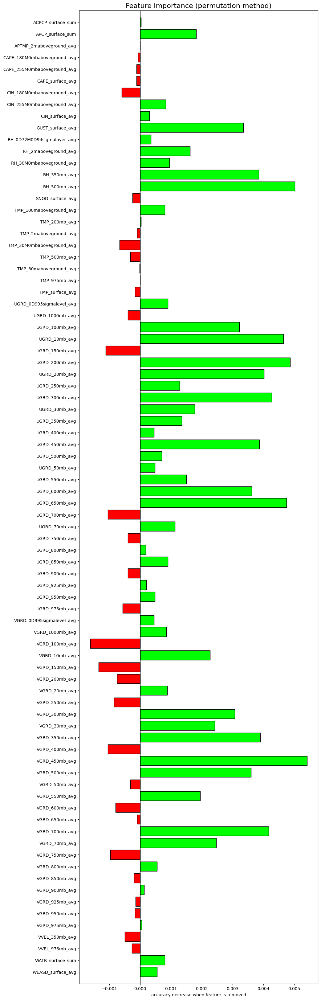

In [22]:
#28 days
fi = learn.feature_importance(feature_names=list(feature_names))

X.shape: (40000, 82, 113)
y.shape: (40000,)
Selected metric: accuracy
Computing feature importance (permutation method)...


  0 feature: BASELINE             accuracy: 0.733900


  0 feature: ACPCP_surface_sum    accuracy: 0.733825


  1 feature: APCP_surface_sum     accuracy: 0.731825


  2 feature: APTMP_2maboveground_avg accuracy: 0.731500


  3 feature: CAPE_180M0mbaboveground_avg accuracy: 0.733800


  4 feature: CAPE_255M0mbaboveground_avg accuracy: 0.733850


  5 feature: CAPE_surface_avg     accuracy: 0.733750


  6 feature: CIN_180M0mbaboveground_avg accuracy: 0.732775


  7 feature: CIN_255M0mbaboveground_avg accuracy: 0.730125


  8 feature: CIN_surface_avg      accuracy: 0.732925


  9 feature: GUST_surface_avg     accuracy: 0.729600


 10 feature: RH_100mb_avg         accuracy: 0.732750


 11 feature: RH_2maboveground_avg accuracy: 0.724975


 12 feature: RH_300mb_avg         accuracy: 0.711175


 13 feature: RH_30M0mbaboveground_avg accuracy: 0.724725


 14 feature: RH_700mb_avg         accuracy: 0.707825


 15 feature: SNOD_surface_avg     accuracy: 0.731075


 16 feature: TMP_100maboveground_avg accuracy: 0.731800


 17 feature: TMP_150mb_avg        accuracy: 0.732850


 18 feature: TMP_2maboveground_avg accuracy: 0.732275


 19 feature: TMP_30M0mbaboveground_avg accuracy: 0.732200


 20 feature: TMP_600mb_avg        accuracy: 0.735050


 21 feature: TMP_80maboveground_avg accuracy: 0.730475


 22 feature: TMP_925mb_avg        accuracy: 0.734575


 23 feature: TMP_surface_avg      accuracy: 0.732675


 24 feature: UGRD_0D995sigmalevel_avg accuracy: 0.732400


 25 feature: UGRD_1000mb_avg      accuracy: 0.733350


 26 feature: UGRD_100mb_avg       accuracy: 0.723650


 27 feature: UGRD_10mb_avg        accuracy: 0.693150


 28 feature: UGRD_150mb_avg       accuracy: 0.710250


 29 feature: UGRD_200mb_avg       accuracy: 0.725375


 30 feature: UGRD_20mb_avg        accuracy: 0.691400


 31 feature: UGRD_250mb_avg       accuracy: 0.670575


 32 feature: UGRD_300mb_avg       accuracy: 0.728525


 33 feature: UGRD_30mb_avg        accuracy: 0.719725


 34 feature: UGRD_350mb_avg       accuracy: 0.725450


 35 feature: UGRD_400mb_avg       accuracy: 0.726075


 36 feature: UGRD_450mb_avg       accuracy: 0.716750


 37 feature: UGRD_500mb_avg       accuracy: 0.720625


 38 feature: UGRD_50mb_avg        accuracy: 0.714525


 39 feature: UGRD_550mb_avg       accuracy: 0.719750


 40 feature: UGRD_600mb_avg       accuracy: 0.722450


 41 feature: UGRD_650mb_avg       accuracy: 0.728450


 42 feature: UGRD_700mb_avg       accuracy: 0.727175


 43 feature: UGRD_70mb_avg        accuracy: 0.726750


 44 feature: UGRD_750mb_avg       accuracy: 0.728025


 45 feature: UGRD_800mb_avg       accuracy: 0.731650


 46 feature: UGRD_850mb_avg       accuracy: 0.733800


 47 feature: UGRD_900mb_avg       accuracy: 0.734150


 48 feature: UGRD_925mb_avg       accuracy: 0.733350


 49 feature: UGRD_950mb_avg       accuracy: 0.731575


 50 feature: UGRD_975mb_avg       accuracy: 0.730825


 51 feature: VGRD_0D995sigmalevel_avg accuracy: 0.733775


 52 feature: VGRD_1000mb_avg      accuracy: 0.732925


 53 feature: VGRD_100mb_avg       accuracy: 0.727800


 54 feature: VGRD_10mb_avg        accuracy: 0.714650


 55 feature: VGRD_150mb_avg       accuracy: 0.723625


 56 feature: VGRD_200mb_avg       accuracy: 0.709825


 57 feature: VGRD_20mb_avg        accuracy: 0.717825


 58 feature: VGRD_250mb_avg       accuracy: 0.726775


 59 feature: VGRD_300mb_avg       accuracy: 0.719725


 60 feature: VGRD_30mb_avg        accuracy: 0.723775


 61 feature: VGRD_350mb_avg       accuracy: 0.721475


 62 feature: VGRD_400mb_avg       accuracy: 0.724275


 63 feature: VGRD_450mb_avg       accuracy: 0.727575


 64 feature: VGRD_500mb_avg       accuracy: 0.726500


 65 feature: VGRD_50mb_avg        accuracy: 0.722700


 66 feature: VGRD_550mb_avg       accuracy: 0.725325


 67 feature: VGRD_600mb_avg       accuracy: 0.713600


 68 feature: VGRD_650mb_avg       accuracy: 0.720300


 69 feature: VGRD_700mb_avg       accuracy: 0.727275


 70 feature: VGRD_70mb_avg        accuracy: 0.725725


 71 feature: VGRD_750mb_avg       accuracy: 0.730725


 72 feature: VGRD_800mb_avg       accuracy: 0.733275


 73 feature: VGRD_850mb_avg       accuracy: 0.731075


 74 feature: VGRD_900mb_avg       accuracy: 0.732650


 75 feature: VGRD_925mb_avg       accuracy: 0.732325


 76 feature: VGRD_950mb_avg       accuracy: 0.733250


 77 feature: VGRD_975mb_avg       accuracy: 0.731700


 78 feature: VVEL_450mb_avg       accuracy: 0.733025


 79 feature: VVEL_750mb_avg       accuracy: 0.733300


 80 feature: WATR_surface_sum     accuracy: 0.732725


 81 feature: WEASD_surface_avg    accuracy: 0.729150



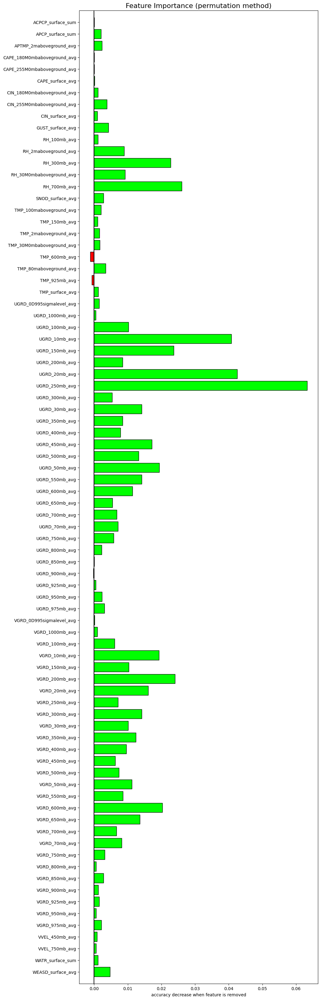

In [24]:
#list feature importances
fi = learn.feature_importance(partial_n=0.1, feature_names=list(feature_names))

In [59]:
ml_path

'D:/OAPMLData//4.MLData/'

In [58]:
#save learn_14
learn_14.export(ml_path + 'model14' + file_label + '20231109' + '.pkl')

In [23]:
#save the model
learn.export(ml_path + 'model_' + file_label + '20231109' + '.pkl')

In [46]:
learn = load_learner(ml_path + 'model_' + file_label + '20231109' + '.pkl')

In [82]:
#predict one batch for learn
ret = learn.get_preds(dl=dls.valid.new(shuffled=False, drop_last=False, splits=splits2[1]))

In [83]:
ret_14 = learn_14.get_preds(dl=dls_14.valid.new(shuffled=False, drop_last=False, splits=splits2[1]))

In [84]:
#find the probabilities of both learn and learn_14 and pick the class with the highest probability
preds = []
for i in range(len(ret[0])):
    ret_or_14 = np.argmax([ret[0][i][0], ret_14[0][i][0]])
    if(ret_or_14 == 0):
        preds.append(ret[1][i])
    else:
        preds.append(ret_14[1][i])

In [90]:
y_valid = y[splits2[1]]

In [92]:
#create scikit learn confusion matrix comparing preds and y_valid
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_valid, preds)

In [94]:
conf_matrix/np.sum(conf_matrix, axis=1)

array([[0.9345, 0.047 , 0.016 , 0.0025],
       [0.209 , 0.6635, 0.0895, 0.038 ],
       [0.238 , 0.1855, 0.4945, 0.082 ],
       [0.25  , 0.2335, 0.2   , 0.3165]])

In [95]:
#calculate balanced accuracy for preds and y_valid
from sklearn.metrics import balanced_accuracy_score
balanced_accuracy_score(y_valid, preds)

0.60225

In [80]:
#compare preds to the actual y values from the dataloader and print the confusion matrix using scikit learn
y_true = []
for i in range(len(ret[0])):
    y_true.append(dls.train[i][1])
    

TypeError: 'TSDataLoader' object is not subscriptable

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)